In [1]:
import pandas as pd
import mir_eval
import librosa
import matplotlib.pyplot as plt
import numpy as np

import IPython.display as ipd

import os
import glob

## Multiple F0 estimation

We use the Late/Deep model from [1] to predict the F0 of each singer from vocal quartets singing **Tebe Poem**.

[1] Helena Cuesta, Brian McFee and Emilia Gómez. **Multiple F0 Estimation in Vocal Ensembles using Convolutional Neural Networks**. In *Proceedings of the International Society for Music Information Retrieval (ISMIR) Conference*, 2020. Montreal, Canada (virtual), pp. 302-309.

### Data subset
We select six performances of **Tebe Poem** from the DCS. First, four takes from the *Full Choir* setting, from which we select four singers (SATB). Then, two takes from the *Quartet A* configuration, also four singers (SATB).

Let's first listen to some of the audio files:

In [3]:
audio_path = './audio'

# full choir example
x, _ = librosa.core.load(os.path.join(audio_path, 'DCS_TP_FullChoir_Take02_mix.wav'), sr=22050.0)
print("Audio file: DCS_TP_FullChoir_Take02. Mixture of 4 DYN microphones.")
ipd.display(ipd.Audio(x, rate=22050))

# quartet A example
x, _ = librosa.core.load(os.path.join(audio_path, 'DCS_TP_QuartetA_Take02_mix.wav'), sr=22050.0)
print("Audio file: DCS_TP_QuartetA_Take02_mix. Stereo mic recording..")
ipd.display(ipd.Audio(x, rate=22050))

Audio file: DCS_TP_FullChoir_Take02. Mixture of 4 DYN microphones.


Audio file: DCS_TP_QuartetA_Take02_mix. Stereo mic recording..


### Predictions
Now we are ready to read the predictions from the model from [1]. They are pre-computed for a faster demo, and stored in CSV files. 

For the evaluation, we first create the multi-pitch reference by combining the F0 extracted from the throat microphones of the singers in the mixture. In the following chunk of code we perform some operations to stack individual F0 contours together to form the multi-pitch reference. It can be ignored, since it reads some files from the dataset that are not available in this repo for space limitations. The generated files are included in the `reference` folder. The threshold we use for the voiced/unvoiced decisions in the reference from CREPE comes from the validation of the automatic annotations in the DCS paper (`thr=0.76` averaged across the test cases).

In [4]:
path_ref = './reference'
thr = 0.75
takes = ['FullChoir_Take01', 'FullChoir_Take02', 'FullChoir_Take03', 'FullChoir_Take04',
        'QuartetA_Take01', 'QuartetA_Take02']

for take in takes:
    singers = glob.glob(os.path.join(path_ref, 'ind', '*{}*.csv'.format(take)))
    f0 = pd.read_csv(singers[0]).values
    N = f0.shape[0]
    multipitch = np.zeros([N, 5])   
    
    idx=0
    for singer in singers:
        idx+=1
        f0 = pd.read_csv(singer).values
        voiced_idx = np.where(f0[:, 2] >= thr)[0]
        multipitch[voiced_idx, idx] = f0[voiced_idx, 1]
    
    multipitch[:, 0] = f0[:, 0]
    
    pd.DataFrame(multipitch).to_csv(os.path.join(path_ref, "DCS_TP_{}_mix.csv".format(take)), 
                                    index=False,header=None)
    
# TODO: optimal threshold from paper experiment

IndexError: list index out of range

We new use `mir_eval` and standard evaluation metrics to assess the performance of the model on our working data. Note that no instance of Tebe Poem was used to train the multi-F0 estimation model.

In [5]:
pred_path = './predictions'
path_ref = './reference'

all_scores = []
for fname in os.listdir(pred_path):
    
    est_times, est_freqs = mir_eval.io.load_ragged_time_series(
        os.path.join(
            pred_path, fname
        ))
    
    ref = pd.read_csv(
        os.path.join(
            path_ref, fname
        )).values
    
    ref_times, ref_freqs = ref[:, 0], list(ref[:, 1:])
    
    for i, (tms, fqs) in enumerate(zip(ref_times, ref_freqs)):
        if any(fqs <= 0):
            ref_freqs[i] = np.array([f for f in fqs if f > 0])
    
    scores = mir_eval.multipitch.evaluate(
        ref_times, ref_freqs,
        est_times, est_freqs, window=0.5
    )
    scores['song'] = fname
    all_scores.append(scores)

/Users/helenacuesta/anaconda3/envs/nyu/lib/python3.6/site-packages/mir_eval/multipitch.py:410: UserWarning: Estimate times not equal to reference times. Resampling to common time base.
  warnings.warn("Estimate times not equal to reference times. "


### Viz of the results

We first generate a plot with the standard metrics and then plot some outputs for a visual evaluation of the results.

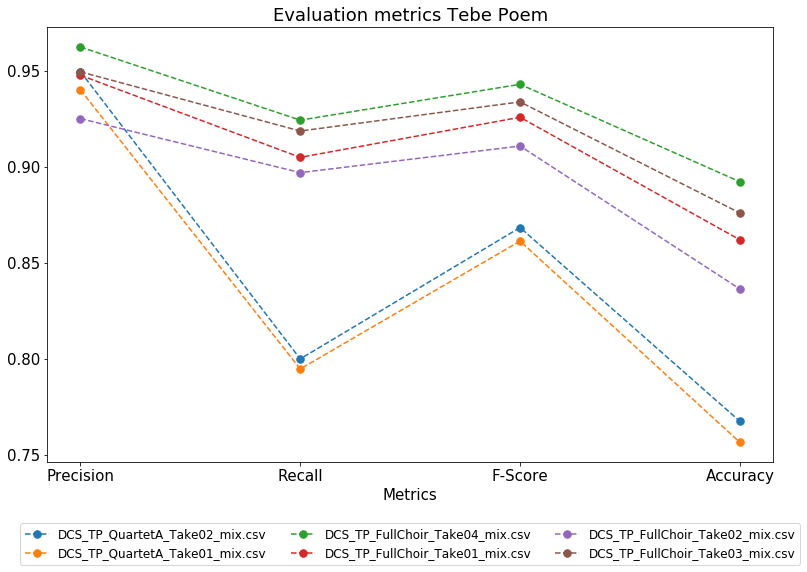

In [6]:
plt.figure(figsize=(13,8))
plt.title('Evaluation metrics Tebe Poem', fontsize=18)

colors = ['red', 'green', 'black', 'magenta']

idx=-1
for s in all_scores:
    metrics = [
        s['Precision'], s['Recall'], 2*(s['Precision']*s['Recall'])/(s['Precision']+s['Recall']), s['Accuracy']
    ]
    plt.plot(np.arange(4), metrics, '.--', label=s['song'], markersize=15)

plt.xlabel('Metrics', fontsize=15), plt.xticks([0, 1, 2, 3], 
                                  ['Precision', 'Recall', 'F-Score', 'Accuracy'], fontsize=15)
plt.yticks(fontsize=15)
plt.legend(bbox_to_anchor=(0.5, -0.25), loc='lower center', ncol=3, fontsize=12)
plt.savefig('tebepoem_metrics_{}.png'.format(thr), bbox_inches='tight')

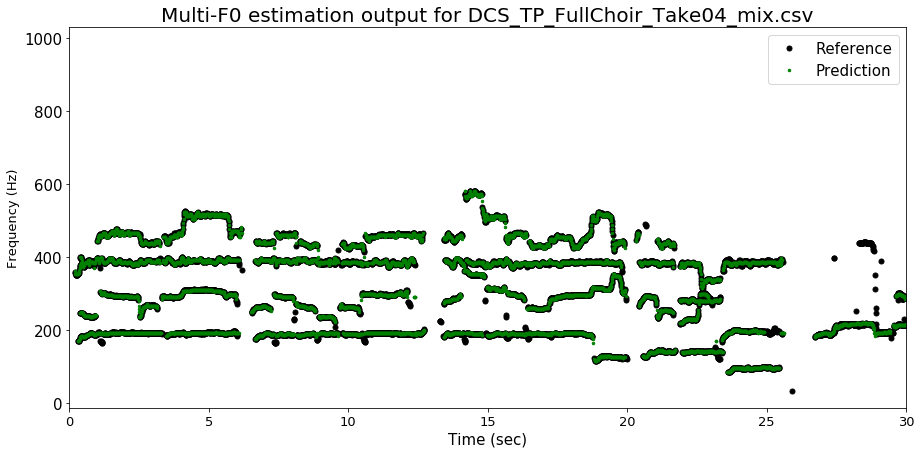

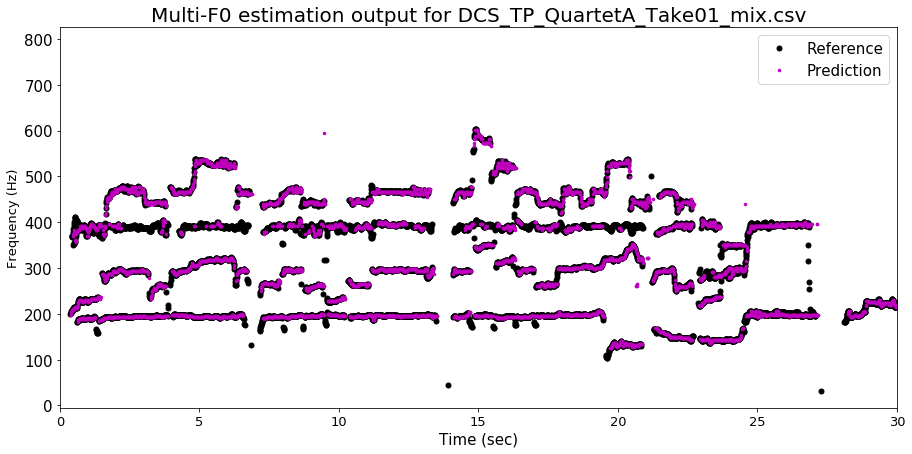

In [7]:
def prepare_data_for_plot(times, freqs):
    
    tms, fqs = [], []
    for t in range(len(times)):
        for f in freqs[t]:
            tms.append(times[t])
            fqs.append(f)
    
    return tms, fqs
            

files_to_display = ['DCS_TP_FullChoir_Take04_mix.csv', 'DCS_TP_QuartetA_Take01_mix.csv']

# plot example for the first file
est_times, est_freqs = mir_eval.io.load_ragged_time_series(
        os.path.join(
            pred_path, files_to_display[0]
        ))
   
ref = pd.read_csv(
    os.path.join(
        path_ref, files_to_display[0]
    )).values

ref_times, ref_freqs = ref[:, 0], list(ref[:, 1:])

for i, (tms, fqs) in enumerate(zip(ref_times, ref_freqs)):
        if any(fqs <= 0):
            ref_freqs[i] = np.array([f for f in fqs if f > 0])

est_times_plot, est_freqs_plot = prepare_data_for_plot(est_times, est_freqs)
ref_times_plot, ref_freqs_plot = prepare_data_for_plot(ref_times, ref_freqs)

plt.figure(figsize=(15,7))
plt.plot(ref_times_plot, ref_freqs_plot, '.k', markersize=10, label='Reference')
plt.plot(est_times_plot, est_freqs_plot, '.g', markersize=5, label='Prediction')
plt.ylabel('Frequency (Hz)', fontsize=13), plt.xlabel('Time (sec)', fontsize=15)
plt.yticks(fontsize=15), plt.xticks(fontsize=13)
plt.xlim([0, 30]), plt.legend(fontsize=15)
plt.title('Multi-F0 estimation output for {}'.format(files_to_display[0]), fontsize=20)
plt.savefig('example_output_fullchoir_{}.png'.format(thr), bbox_inches='tight')

# plot example for the second file
est_times, est_freqs = mir_eval.io.load_ragged_time_series(
        os.path.join(
            pred_path, files_to_display[1]
        ))
   
ref = pd.read_csv(
    os.path.join(
        path_ref, files_to_display[1]
    )).values

ref_times, ref_freqs = ref[:, 0], list(ref[:, 1:])

for i, (tms, fqs) in enumerate(zip(ref_times, ref_freqs)):
        if any(fqs <= 0):
            ref_freqs[i] = np.array([f for f in fqs if f > 0])

est_times_plot, est_freqs_plot = prepare_data_for_plot(est_times, est_freqs)
ref_times_plot, ref_freqs_plot = prepare_data_for_plot(ref_times, ref_freqs)

plt.figure(figsize=(15,7))
plt.plot(ref_times_plot, ref_freqs_plot, '.k', markersize=10, label='Reference')
plt.plot(est_times_plot, est_freqs_plot, '.m', markersize=5, label='Prediction')
plt.ylabel('Frequency (Hz)', fontsize=13), plt.xlabel('Time (sec)', fontsize=15)
plt.yticks(fontsize=15), plt.xticks(fontsize=13)
plt.xlim([0, 30]), plt.legend(fontsize=15)
plt.title('Multi-F0 estimation output for {}'.format(files_to_display[1]), fontsize=20)
plt.savefig('example_output_quarteta_{}.png'.format(thr), bbox_inches='tight')


### Listening to the outputs

For an additional analysis of the outputs, we sonified the outputs of the multi-pitch estimation model.

In [9]:
audio_path = './synth/'

# full choir example
x, _ = librosa.core.load(os.path.join(audio_path, 'DCS_TP_FullChoir_Take02_mix_sonif.wav'), sr=22050.0)
print("Audio file: Sonification of the output of DCS_TP_FullChoir_Take02. Mixture of 4 DYN microphones.")
ipd.display(ipd.Audio(x, rate=22050))

# quartet A example
x, _ = librosa.core.load(os.path.join(audio_path, 'DCS_TP_QuartetA_Take02_mix_sonif.wav'), sr=22050.0)
print("Audio file:Sonification of the output of  DCS_TP_QuartetA_Take02_mix. Stereo mic recording..")
ipd.display(ipd.Audio(x, rate=22050))

Audio file: Sonification of the output of DCS_TP_FullChoir_Take02. Mixture of 4 DYN microphones.


Audio file:Sonification of the output of  DCS_TP_QuartetA_Take02_mix. Stereo mic recording..


We hear how the output of the artificial mixture of 4 DYN microphones sounds significantly better than the output from the stereo microphone. This coincides with the results we see in the plots above, where the Alto part jumps in and out constantly, making the Recall decrease for these files.